# From here

In [1]:
# from IPython.display import display, HTML
# display(HTML("<style>.container { width:80% !important; }</style>"))
%load_ext autotime

time: 0 ns (started: 2022-12-13 13:05:25 +09:00)


In [2]:
import numpy as np
import math
import tensorflow as tf
from sklearn.decomposition import PCA
from tensorflow.keras.models import Model
from tensorflow.keras import layers, losses
import torch
import torch.nn as nn
from matplotlib import pyplot as plt
from numpy import savetxt
import pennylane as qml

time: 3.31 s (started: 2022-12-13 13:05:25 +09:00)


To see if the directory path is added to the sys.path, check `sys.path`

In [3]:
# Add directory path of the python-module files to import them.
import sys
# sys.path.insert(0,'/content/drive/MyDrive/qsvdd/QCNN_code_(working)/QCNN-main/Final_QCNN_mod')
sys.path

['C:\\Users\\user1\\Quantum\\qsvdd',
 'C:\\Users\\user1\\anaconda3\\python39.zip',
 'C:\\Users\\user1\\anaconda3\\DLLs',
 'C:\\Users\\user1\\anaconda3\\lib',
 'C:\\Users\\user1\\anaconda3',
 '',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\win32',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\win32\\lib',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\Pythonwin']

time: 0 ns (started: 2022-12-13 13:05:29 +09:00)


# Data Preparation
- 'MNIST' data is a dataset of 60,000, 28$\times$28 grayscale images of the 10 digits, along with a test set of 10,000 images.
- Each pixel has grey scale value that ranges from 0 to 255.
- More info can be found at the [MNIST homepage](http://yann.lecun.com/exdb/mnist/).
- QCNN : https://github.com/takh04/QCNN/blob/main/README.md


- for "0" image classification
- resize images to 256 to fit with 8 qubits

In [4]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()


time: 141 ms (started: 2022-12-13 13:05:29 +09:00)


In [5]:
x_train.shape

(60000, 28, 28)

time: 0 ns (started: 2022-12-13 13:05:29 +09:00)


In [6]:
x_train, x_test = x_train[..., np.newaxis] / 255.0, x_test[..., np.newaxis] / 255.0  # normalize the data

time: 110 ms (started: 2022-12-13 13:05:29 +09:00)


In [7]:
x_train_filter_5 = np.where(y_train == 5)
x_test_filter_5 = np.where(y_test == 5)

X_train = x_train[x_train_filter_5]
X_test = x_test[x_test_filter_5]
Y_train = y_train[x_train_filter_5]
Y_test = y_test[x_test_filter_5]

time: 16 ms (started: 2022-12-13 13:05:29 +09:00)


In [8]:
X_train.shape

(5421, 28, 28, 1)

time: 0 ns (started: 2022-12-13 13:05:29 +09:00)


In [9]:
X_train = tf.image.resize(X_train[:], (256, 1)).numpy()
X_test = tf.image.resize(X_test[:], (256, 1)).numpy()
X_train, X_test = tf.squeeze(X_train).numpy(), tf.squeeze(X_test).numpy()

time: 47 ms (started: 2022-12-13 13:05:29 +09:00)


In [10]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(5421, 256)
(892, 256)
(5421,)
(892,)
time: 0 ns (started: 2022-12-13 13:05:29 +09:00)


In [11]:
center = qml.numpy.zeros([6], requires_grad=True)
center_train = np.tile(center,(len(X_train),1))
center_train

tensor([[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]], requires_grad=True)

time: 0 ns (started: 2022-12-13 13:05:29 +09:00)


In [12]:
%run ./qcnn_code/Angular_hybrid.py
%run ./qcnn_code/unitary.py
%run ./qcnn_code/embedding.py
%run ./qcnn_code/QCNN_circuit.py
%run ./qcnn_code/Training.py

time: 62 ms (started: 2022-12-13 13:05:29 +09:00)


In [13]:
train_Xdata = X_train
train_Ydata = center_train
conv_filter = 'U_SU4_no_pooling'
# parameter_weights = np.zeros(15)
num_params_conv = 15
data_encoding = 'Amplitude'
circuit_type = 'QCNN'
cost_func = 'svdd'
measure_basis = 'Z'

loss_history, est_params, param_history = circuit_training(X_train=train_Xdata,
                                            Y_train=train_Ydata,
                                            U=conv_filter,
                                            U_params=num_params_conv,
                                            embedding_type=data_encoding,
                                            circuit=circuit_type,
                                            cost_fn=cost_func,
                                            measure_axis=measure_basis)

C:\Users\user1\anaconda3\lib\site-packages\autograd\numpy\numpy_vjps.py:698: ComplexWarning: Casting complex values to real discards the imaginary part
  onp.add.at(A, idx, x)


iteration:  0  cost:  0.050979084730270345
iteration:  5  cost:  0.051114428662936195
iteration:  10  cost:  0.05073419183380672
iteration:  15  cost:  0.03700378899562289
iteration:  20  cost:  0.03048665358326282
iteration:  25  cost:  0.04115311611921779
iteration:  30  cost:  0.023707399290696575
iteration:  35  cost:  0.02198498632001883
iteration:  40  cost:  0.02827682465585823
iteration:  45  cost:  0.020177560215379073
iteration:  50  cost:  0.021037781033418763
iteration:  55  cost:  0.01557531565847339
iteration:  60  cost:  0.014584752203762763
iteration:  65  cost:  0.015163071662001624
iteration:  70  cost:  0.013566821594327014
iteration:  75  cost:  0.007598258511524802
iteration:  80  cost:  0.012256040019239235
iteration:  85  cost:  0.010882083856855696
iteration:  90  cost:  0.008965711085063794
iteration:  95  cost:  0.013402665569152318
iteration:  100  cost:  0.01116211746200148
iteration:  105  cost:  0.009620740340197725
iteration:  110  cost:  0.01020061893298

In [14]:
# from pennylane import numpy as np
# est_params = np.random.randn(45, requires_grad = True)
est_params

tensor([ 0.22082603,  0.90891119,  0.53910247,  0.90017438, -0.4851653 ,
         0.12541347, -0.04833017,  0.10918807, -0.06429808,  0.0448719 ,
         0.06769642, -0.00362538,  0.81397531,  1.62153706, -0.0122126 ,
        -0.06277054, -0.54401354,  0.90913035,  0.13224596,  0.14332544,
         1.47204092, -0.98233488, -0.16626906,  0.51334517,  0.43070983,
        -1.73232475, -2.22181652,  0.5335469 ,  1.26571209, -0.96941531,
        -1.44630969, -0.88577652, -0.15763246,  0.26179962,  0.99523381,
         0.45220452,  0.70453777, -0.40936349, -1.15858218, -1.70817732,
        -0.08152348, -0.96619352, -0.32212591, -0.38357826, -1.40623148,
        -0.09683782,  0.38656693, -0.34119344,  0.09023128,  0.9488742 ,
         0.37585243,  1.51464402,  0.15682627,  0.12883495, -0.15245316,
        -0.74656357, -2.970235  ,  0.26964709, -1.11883838, -0.54414747,
        -0.56643505, -0.40744003,  1.33664181,  1.47747312,  0.63110847,
         0.07309779, -0.70717533,  0.20797562, -1.5

time: 0 ns (started: 2022-12-14 02:45:19 +09:00)


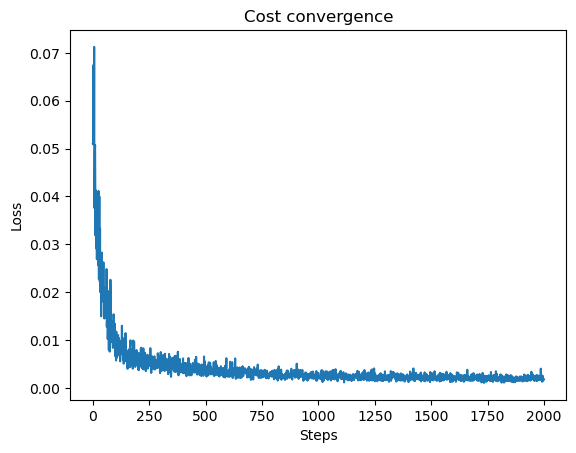

time: 391 ms (started: 2022-12-14 02:45:19 +09:00)


In [15]:
plt.plot(loss_history)
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.title("Cost convergence")

plt.savefig('./img/OCC5/qsvdd/cost_qsvdd.png')

In [16]:
savetxt('./img/OCC5/qsvdd/param_list_qcnn',est_params.numpy(),delimiter=',')

time: 0 ns (started: 2022-12-14 02:45:20 +09:00)


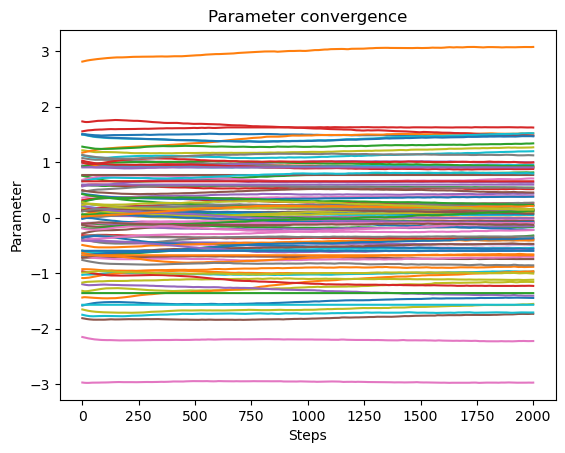

time: 484 ms (started: 2022-12-14 02:45:20 +09:00)


In [17]:
plt.plot(param_history)
plt.xlabel("Steps")
plt.ylabel("Parameter")
plt.title("Parameter convergence")
plt.savefig('./img/OCC5/qsvdd/parameters_qsvdd.png')

### train result

In [18]:
# Implement trained circuit for MNIST "1" train data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp0 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X_train])

time: 53min 5s (started: 2022-12-14 02:45:20 +09:00)


In [19]:
predictions_exp0

tensor([[-0.0018319 , -0.00966844, -0.0180024 ,  0.00142331,  0.00633766,
         -0.01714812],
        [-0.00299542, -0.0085261 ,  0.03432486,  0.01556923, -0.00207109,
         -0.00701932],
        [-0.01598098,  0.0108025 ,  0.00805212,  0.00886642,  0.0021123 ,
         -0.00513134],
        ...,
        [ 0.01022296,  0.04979009,  0.06890549,  0.04331685, -0.00951766,
         -0.01852503],
        [ 0.02278915,  0.06354174,  0.05917719, -0.01946193, -0.00926791,
         -0.02342683],
        [ 0.01832655,  0.02266106,  0.00149959,  0.01536509,  0.01577132,
         -0.0037442 ]], requires_grad=True)

time: 0 ns (started: 2022-12-14 03:38:25 +09:00)


In [20]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]

time: 9.45 s (started: 2022-12-14 03:38:25 +09:00)


In [21]:
# center = center.detach().numpy()

time: 0 ns (started: 2022-12-14 03:38:35 +09:00)


In [22]:
# center[0]

time: 0 ns (started: 2022-12-14 03:38:35 +09:00)


In [23]:
predictions_exp = 0

time: 0 ns (started: 2022-12-14 03:38:35 +09:00)


In [24]:
import plotly.express as px
import plotly.graph_objects as go


label_value_string = np.array(Y_train).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp0[:,0], 
                          y = predictions_exp0[:,1], 
                          z = predictions_exp0[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
# fig_ploty.update_layout(scene = dict(xaxis = dict(nticks=10, range=[-1,1],),
#                                      yaxis = dict(nticks=4, range=[-1,1],),
#                                      zaxis = dict(nticks=4, range=[-1,1],),),
#                         margin=dict(r=10, l=10, b=10, t=10))
fig_ploty.update_traces(marker_size = 1.5)


fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)

fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()
fig_ploty.write_html('./img/OCC5/qsvdd/train.html')
# fig_test_ploty.write_html('Result/ploty_figure_test.html')

time: 14.8 s (started: 2022-12-14 03:38:35 +09:00)


In [25]:
# L1-norm of trained MNIST "0" train data
abs(predictions_exp0 - center).mean(axis=1).mean()

tensor(0.01389198, requires_grad=True)

time: 0 ns (started: 2022-12-14 03:38:50 +09:00)


In [26]:
score_train = abs(predictions_exp0 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 03:38:50 +09:00)


In [27]:
score_var_train = abs(predictions_exp0 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 03:38:50 +09:00)


### score for test data

In [28]:
X_test = np.delete(X_test,173,0)

time: 16 ms (started: 2022-12-14 03:38:50 +09:00)


In [29]:
# Implement trained circuit for MNIST "0" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp0_test = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X_test])

time: 8min 36s (started: 2022-12-14 03:38:50 +09:00)


In [30]:
print(predictions_exp0_test)
print(predictions_exp0_test.shape)

[[ 0.02954312 -0.00295533 -0.01120645  0.00755427 -0.00033143  0.02330708]
 [-0.00633853  0.0329115  -0.02980587 -0.0040819   0.02130409 -0.01488082]
 [ 0.00878402  0.0106887  -0.0532944  -0.00833493 -0.01319989  0.00231782]
 ...
 [ 0.01659121 -0.00087956  0.01375787 -0.01400285 -0.0026579  -0.02019879]
 [ 0.00973279  0.00593784 -0.01868039  0.00270139 -0.0190598  -0.01988371]
 [ 0.00129584  0.00019538 -0.00371284  0.01549662 -0.01245607 -0.0062808 ]]
(891, 6)
time: 0 ns (started: 2022-12-14 03:47:26 +09:00)


In [31]:
score_test0 = abs(predictions_exp0_test - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 03:47:26 +09:00)


In [32]:
score_var_test0 = abs(predictions_exp0_test - center).mean(axis=1)


time: 0 ns (started: 2022-12-14 03:47:26 +09:00)


In [33]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 03:47:26 +09:00)


In [34]:
import plotly.express as px
import plotly.graph_objects as go

label_value_string = np.array(Y_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp0_test[:,0], 
                          y = predictions_exp0_test[:,1], 
                          z = predictions_exp0_test[:,2],
                          # color = label_value_string, 
                          opacity=0.7,
                          width=960, height=960)
# fig_ploty.update_layout(scene = dict(xaxis = dict(nticks=10, range=[-1,1],),
#                                      yaxis = dict(nticks=4, range=[-1,1],),
#                                      zaxis = dict(nticks=4, range=[-1,1],),),
#                         margin=dict(r=10, l=10, b=10, t=10))
fig_ploty.update_traces(marker_size = 1.5)
# fig_ploty.show()

fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC5/qsvdd/test.html')

time: 218 ms (started: 2022-12-14 03:47:26 +09:00)


### score for test0

In [35]:
x_train_filter_1 = np.where(y_train == 0)
x_test_filter_1 = np.where(y_test == 0)

X1_train = x_train[x_train_filter_1]
X1_test = x_test[x_test_filter_1]
Y1_train = y_train[x_train_filter_1]
Y1_test = y_test[x_test_filter_1]

time: 63 ms (started: 2022-12-14 03:47:26 +09:00)


In [36]:
X1_train.shape

(5923, 28, 28, 1)

time: 0 ns (started: 2022-12-14 03:47:26 +09:00)


In [37]:
X1_train = tf.image.resize(X1_train[:], (256, 1)).numpy()
X1_test = tf.image.resize(X1_test[:], (256, 1)).numpy()
X1_train, X1_test = tf.squeeze(X1_train).numpy(), tf.squeeze(X1_test).numpy()

time: 32 ms (started: 2022-12-14 03:47:26 +09:00)


In [38]:
print(X1_train.shape)
print(X1_test.shape)
print(Y1_train.shape)
print(Y1_test.shape)

(5923, 256)
(980, 256)
(5923,)
(980,)
time: 15 ms (started: 2022-12-14 03:47:26 +09:00)


In [39]:
# Implement trained circuit for MNIST "1" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp1 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X1_test])

time: 9min 40s (started: 2022-12-14 03:47:26 +09:00)


In [40]:
print(predictions_exp1)
print(predictions_exp1.shape)

[[-0.01161461  0.02372121  0.06097933  0.00371976  0.00626165 -0.0051823 ]
 [ 0.00377451  0.00468482  0.0189281   0.0461544   0.01453376 -0.01726843]
 [ 0.01222853  0.00878497  0.01821581  0.01072107  0.00019109  0.00409959]
 ...
 [ 0.01835535 -0.00037944 -0.01023912 -0.00562257 -0.00339028 -0.03361011]
 [-0.01189322  0.02037329  0.04430445  0.00423582 -0.02346772 -0.01102803]
 [-0.00610668  0.00872755 -0.01578255  0.00269307 -0.00225826 -0.02162443]]
(980, 6)
time: 15 ms (started: 2022-12-14 03:57:06 +09:00)


In [41]:
# L1-norm of MNIST "1"
abs(predictions_exp1 - center).mean(axis=1).mean()

tensor(0.01921194, requires_grad=True)

time: 16 ms (started: 2022-12-14 03:57:06 +09:00)


In [42]:
score_test1 = abs(predictions_exp1 - center).mean(axis=1).mean()

time: 16 ms (started: 2022-12-14 03:57:06 +09:00)


In [43]:
score_var_test1 = abs(predictions_exp1 - center).mean(axis=1)

time: 15 ms (started: 2022-12-14 03:57:07 +09:00)


In [44]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 15 ms (started: 2022-12-14 03:57:07 +09:00)


In [45]:

label_value_string = np.array(Y1_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp1[:,0], 
                          y = predictions_exp1[:,1], 
                          z = predictions_exp1[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC5/qsvdd/test0.html')

time: 203 ms (started: 2022-12-14 03:57:07 +09:00)


### score for test1

In [46]:
x_train_filter_2 = np.where(y_train == 1)
x_test_filter_2 = np.where(y_test == 1)

X2_train = x_train[x_train_filter_2]
X2_test = x_test[x_test_filter_2]
Y2_train = y_train[x_train_filter_2]
Y2_test = y_test[x_test_filter_2]

time: 31 ms (started: 2022-12-14 03:57:07 +09:00)


In [47]:
X2_train.shape

(6742, 28, 28, 1)

time: 0 ns (started: 2022-12-14 03:57:07 +09:00)


In [48]:
X2_train = tf.image.resize(X2_train[:], (256, 1)).numpy()
X2_test = tf.image.resize(X2_test[:], (256, 1)).numpy()
X2_train, X2_test = tf.squeeze(X2_train).numpy(), tf.squeeze(X2_test).numpy()

time: 32 ms (started: 2022-12-14 03:57:07 +09:00)


In [49]:
print(X2_train.shape)
print(X2_test.shape)
print(Y2_train.shape)
print(Y2_test.shape)

(6742, 256)
(1135, 256)
(6742,)
(1135,)
time: 0 ns (started: 2022-12-14 03:57:07 +09:00)


In [50]:
# Implement trained circuit for MNIST "2" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp2 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X2_test])

time: 11min 14s (started: 2022-12-14 03:57:07 +09:00)


In [51]:
print(predictions_exp2)
print(predictions_exp2.shape)

[[-0.00695695 -0.0189125   0.0144157   0.02136037 -0.0022627   0.0164375 ]
 [-0.0136286  -0.0191697   0.01854943  0.0145885   0.00264176 -0.00250068]
 [-0.00491373  0.01457842 -0.00815671 -0.00452182 -0.00356699  0.00715653]
 ...
 [ 0.05002888 -0.01342646  0.05358857  0.00056892  0.01968771  0.02647163]
 [-0.01345212  0.00268556  0.02158973  0.02163179  0.0123968   0.00072062]
 [ 0.00246026  0.00130635  0.01239508  0.00680064  0.00612311  0.00304139]]
(1135, 6)
time: 0 ns (started: 2022-12-14 04:08:21 +09:00)


In [52]:
# L1-norm of MNIST "2"
abs(predictions_exp2 - center).mean(axis=1).mean()

tensor(0.01143353, requires_grad=True)

time: 2.75 s (started: 2022-12-14 04:08:21 +09:00)


In [53]:
score_test2 = abs(predictions_exp2 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:08:24 +09:00)


In [54]:
score_var_test2 = abs(predictions_exp2 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:08:24 +09:00)


In [55]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 16 ms (started: 2022-12-14 04:08:24 +09:00)


In [56]:

label_value_string = np.array(Y2_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp2[:,0], 
                          y = predictions_exp2[:,1], 
                          z = predictions_exp2[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC5/qsvdd/test1.html')

time: 312 ms (started: 2022-12-14 04:08:24 +09:00)


### score for test2

In [57]:
x_train_filter_3 = np.where(y_train == 2)
x_test_filter_3 = np.where(y_test == 2)

X3_train = x_train[x_train_filter_3]
X3_test = x_test[x_test_filter_3]
Y3_train = y_train[x_train_filter_3]
Y3_test = y_test[x_test_filter_3]

X3_train.shape

(5958, 28, 28, 1)

time: 31 ms (started: 2022-12-14 04:08:25 +09:00)


In [58]:
X3_train = tf.image.resize(X3_train[:], (256, 1)).numpy()
X3_test = tf.image.resize(X3_test[:], (256, 1)).numpy()
X3_train, X3_test = tf.squeeze(X3_train).numpy(), tf.squeeze(X3_test).numpy()

print(X3_train.shape)
print(X3_test.shape)
print(Y3_train.shape)
print(Y3_test.shape)

(5958, 256)
(1032, 256)
(5958,)
(1032,)
time: 31 ms (started: 2022-12-14 04:08:25 +09:00)


In [59]:
# Implement trained circuit for MNIST "3" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp3 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X3_test])

time: 10min 15s (started: 2022-12-14 04:08:25 +09:00)


In [60]:
print(predictions_exp3)
print(predictions_exp3.shape)

[[ 0.01728479  0.04414998  0.02977773  0.01865115  0.00813684  0.04384714]
 [ 0.07613883 -0.00153423  0.03592683  0.03962802 -0.05297428  0.00759498]
 [-0.00191916 -0.01051819 -0.02205573  0.0048074   0.01170305  0.02117812]
 ...
 [ 0.0049544  -0.00402217 -0.03648862  0.02014655 -0.00812064 -0.01720729]
 [ 0.02288032 -0.00613833 -0.00549281  0.02664826 -0.03854672  0.02120132]
 [ 0.03116604 -0.01625896 -0.00292311  0.02874628 -0.04338866  0.0132159 ]]
(1032, 6)
time: 15 ms (started: 2022-12-14 04:18:40 +09:00)


In [61]:
# L1-norm of MNIST "3"
abs(predictions_exp3 - center).mean(axis=1).mean()

tensor(0.02240678, requires_grad=True)

time: 15 ms (started: 2022-12-14 04:18:40 +09:00)


In [62]:
score_test3 = abs(predictions_exp3 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:18:40 +09:00)


In [63]:
score_var_test3 = abs(predictions_exp3 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:18:40 +09:00)


In [64]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:18:40 +09:00)


In [65]:

label_value_string = np.array(Y3_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp3[:,0], 
                          y = predictions_exp3[:,1], 
                          z = predictions_exp3[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC5/qsvdd/test2.html')

time: 203 ms (started: 2022-12-14 04:18:40 +09:00)


### score for test3

In [66]:
x_train_filter_4 = np.where(y_train == 3)
x_test_filter_4 = np.where(y_test == 3)

X4_train = x_train[x_train_filter_4]
X4_test = x_test[x_test_filter_4]
Y4_train = y_train[x_train_filter_4]
Y4_test = y_test[x_test_filter_4]

X4_train.shape

(6131, 28, 28, 1)

time: 31 ms (started: 2022-12-14 04:18:41 +09:00)


In [67]:
X4_train = tf.image.resize(X4_train[:], (256, 1)).numpy()
X4_test = tf.image.resize(X4_test[:], (256, 1)).numpy()
X4_train, X4_test = tf.squeeze(X4_train).numpy(), tf.squeeze(X4_test).numpy()

print(X4_train.shape)
print(X4_test.shape)
print(Y4_train.shape)
print(Y4_test.shape)

(6131, 256)
(1010, 256)
(6131,)
(1010,)
time: 31 ms (started: 2022-12-14 04:18:41 +09:00)


In [68]:
# Implement trained circuit for MNIST "4" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp4 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X4_test])

time: 10min (started: 2022-12-14 04:18:41 +09:00)


In [69]:
print(predictions_exp4)
print(predictions_exp4.shape)

[[ 0.01098233 -0.00793139 -0.01156146  0.00046354  0.01495394 -0.00747789]
 [ 0.00773722 -0.01779564 -0.02248649 -0.00981241 -0.00360578 -0.01661477]
 [-0.00401427 -0.00569989 -0.0162771  -0.00892647  0.00148258  0.00328328]
 ...
 [ 0.02349811 -0.00261068 -0.0276971   0.00540699 -0.00624792 -0.02813314]
 [ 0.01395954 -0.00996669  0.00970529  0.00801441  0.00730751  0.02292801]
 [-0.02249788  0.01202986  0.03226956 -0.0114819   0.01929172  0.00416313]]
(1010, 6)
time: 0 ns (started: 2022-12-14 04:28:41 +09:00)


In [70]:
# L1-norm of MNIST "4"
abs(predictions_exp4 - center).mean(axis=1).mean()

tensor(0.01388493, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:28:41 +09:00)


In [71]:
score_test4 = abs(predictions_exp4 - center).mean(axis=1).mean()


time: 0 ns (started: 2022-12-14 04:28:41 +09:00)


In [72]:
score_var_test4 = abs(predictions_exp4 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:28:41 +09:00)


In [73]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:28:41 +09:00)


In [74]:

label_value_string = np.array(Y4_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp4[:,0], 
                          y = predictions_exp4[:,1], 
                          z = predictions_exp4[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC5/qsvdd/test4.html')

time: 203 ms (started: 2022-12-14 04:28:41 +09:00)


### score for test4

In [75]:
x_train_filter_5 = np.where(y_train == 4)
x_test_filter_5 = np.where(y_test == 4)

X4_train = x_train[x_train_filter_5]
X4_test = x_test[x_test_filter_5]
Y4_train = y_train[x_train_filter_5]
Y4_test = y_test[x_test_filter_5]

X4_train.shape

(5842, 28, 28, 1)

time: 47 ms (started: 2022-12-14 04:28:42 +09:00)


In [76]:
X4_train = tf.image.resize(X4_train[:], (256, 1)).numpy()
X4_test = tf.image.resize(X4_test[:], (256, 1)).numpy()
X4_train, X4_test = tf.squeeze(X4_train).numpy(), tf.squeeze(X4_test).numpy()

print(X4_train.shape)
print(X4_test.shape)
print(Y4_train.shape)
print(Y4_test.shape)

(5842, 256)
(982, 256)
(5842,)
(982,)
time: 47 ms (started: 2022-12-14 04:28:42 +09:00)


In [77]:
# Implement trained circuit for MNIST "4" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp5 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X4_test])

time: 9min 43s (started: 2022-12-14 04:28:42 +09:00)


In [78]:
print(predictions_exp5)
print(predictions_exp5.shape)

[[ 0.00803122 -0.00926132  0.0405564  -0.00220508  0.02198841 -0.00948974]
 [ 0.01235007  0.01596104  0.05595405  0.04067698  0.02360833  0.00984338]
 [ 0.04911268 -0.06434607  0.03013395 -0.02287459  0.02702937  0.03667146]
 ...
 [-0.00439554 -0.02034208  0.00928589  0.02065226  0.01907966  0.01828512]
 [-0.00461353 -0.01907484  0.02235447  0.02846426  0.00381071  0.01430876]
 [-0.00611412 -0.03440115  0.00532105  0.01400726 -0.00957565  0.01811704]]
(982, 6)
time: 0 ns (started: 2022-12-14 04:38:26 +09:00)


In [79]:
# L1-norm of MNIST "4"
abs(predictions_exp5 - center).mean(axis=1).mean()

tensor(0.02069971, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:38:26 +09:00)


In [80]:
score_test5 = abs(predictions_exp5 - center).mean(axis=1).mean()


time: 0 ns (started: 2022-12-14 04:38:26 +09:00)


In [81]:
score_var_test5 = abs(predictions_exp5 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:38:26 +09:00)


In [82]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:38:26 +09:00)


In [83]:

label_value_string = np.array(Y4_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp5[:,0], 
                          y = predictions_exp5[:,1], 
                          z = predictions_exp5[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC5/qsvdd/test4.html')

time: 219 ms (started: 2022-12-14 04:38:26 +09:00)


### score for test6

In [84]:
x_train_filter_6 = np.where(y_train == 6)
x_test_filter_6 = np.where(y_test == 6)

X6_train = x_train[x_train_filter_6]
X6_test = x_test[x_test_filter_6]
Y6_train = y_train[x_train_filter_6]
Y6_test = y_test[x_test_filter_6]

X6_train.shape

(5918, 28, 28, 1)

time: 31 ms (started: 2022-12-14 04:38:26 +09:00)


In [85]:
X6_train = tf.image.resize(X6_train[:], (256, 1)).numpy()
X6_test = tf.image.resize(X6_test[:], (256, 1)).numpy()
X6_train, X6_test = tf.squeeze(X6_train).numpy(), tf.squeeze(X6_test).numpy()

print(X6_train.shape)
print(X6_test.shape)
print(Y6_train.shape)
print(Y6_test.shape)

(5918, 256)
(958, 256)
(5918,)
(958,)
time: 47 ms (started: 2022-12-14 04:38:26 +09:00)


In [86]:
# Implement trained circuit for MNIST "6" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp6 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X6_test])

time: 9min 29s (started: 2022-12-14 04:38:26 +09:00)


In [87]:
print(predictions_exp6)
print(predictions_exp6.shape)

[[ 3.33178993e-02  1.63104798e-02 -9.02937227e-03  1.44367955e-02
   1.61390032e-02 -4.98864574e-03]
 [ 1.60739011e-02  1.83336759e-02 -1.52140781e-02  3.23103958e-02
   9.34799003e-04  2.10713215e-02]
 [-1.84871005e-02 -3.45143906e-02 -9.38668921e-03  2.76665828e-02
  -1.13028718e-02  2.85225741e-02]
 ...
 [-2.27028226e-02  2.14075425e-02  2.71056230e-02  1.89086343e-02
  -9.66754013e-04 -2.97703760e-03]
 [ 9.14106965e-03  8.38352252e-03 -1.94984374e-02 -5.12560247e-03
   2.39774054e-03 -8.44770523e-03]
 [ 2.04811360e-02 -2.00125716e-02 -1.39803537e-02  9.28944487e-03
  -1.33824032e-02 -1.91288571e-05]]
(958, 6)
time: 0 ns (started: 2022-12-14 04:47:55 +09:00)


In [88]:
# L1-norm of MNIST "6"
abs(predictions_exp6 - center).mean(axis=1).mean()

tensor(0.02117899, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:47:55 +09:00)


In [89]:
score_test6 = abs(predictions_exp6 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:47:55 +09:00)


In [90]:
score_var_test6 = abs(predictions_exp6 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:47:55 +09:00)


In [91]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 16 ms (started: 2022-12-14 04:47:55 +09:00)


In [92]:

label_value_string = np.array(Y6_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp6[:,0], 
                          y = predictions_exp6[:,1], 
                          z = predictions_exp6[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC5/qsvdd/test6.html')

time: 218 ms (started: 2022-12-14 04:47:55 +09:00)


### score for test7

In [93]:
x_train_filter_7 = np.where(y_train == 7)
x_test_filter_7 = np.where(y_test == 7)

X7_train = x_train[x_train_filter_7]
X7_test = x_test[x_test_filter_7]
Y7_train = y_train[x_train_filter_7]
Y7_test = y_test[x_test_filter_7]

X7_train.shape

(6265, 28, 28, 1)

time: 47 ms (started: 2022-12-14 04:47:56 +09:00)


In [94]:
X7_train = tf.image.resize(X7_train[:], (256, 1)).numpy()
X7_test = tf.image.resize(X7_test[:], (256, 1)).numpy()
X7_train, X7_test = tf.squeeze(X7_train).numpy(), tf.squeeze(X7_test).numpy()

print(X7_train.shape)
print(X7_test.shape)
print(Y7_train.shape)
print(Y7_test.shape)

(6265, 256)
(1028, 256)
(6265,)
(1028,)
time: 32 ms (started: 2022-12-14 04:47:56 +09:00)


In [95]:
# Implement trained circuit for MNIST "7" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp7 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X7_test])

time: 10min 9s (started: 2022-12-14 04:47:56 +09:00)


In [96]:
print(predictions_exp7)
print(predictions_exp7.shape)

[[ 0.03017691  0.00135058  0.03410967  0.03573988  0.00611919  0.05056331]
 [ 0.03011892  0.01888388  0.0380259   0.03062571  0.00606268  0.03974563]
 [-0.03955802 -0.05427204 -0.01816978  0.04534548 -0.05541055 -0.0556504 ]
 ...
 [ 0.01629547 -0.01437857 -0.00902572  0.02435401 -0.00433262  0.01684662]
 [ 0.02325018  0.00441403 -0.00771656  0.02658962  0.00051669  0.0018454 ]
 [ 0.01085112 -0.00852327  0.00032225  0.02415842 -0.00714718  0.03336234]]
(1028, 6)
time: 0 ns (started: 2022-12-14 04:58:05 +09:00)


In [97]:
# L1-norm of MNIST "7"
abs(predictions_exp7 - center).mean(axis=1).mean()

tensor(0.02087173, requires_grad=True)

time: 15 ms (started: 2022-12-14 04:58:05 +09:00)


In [98]:
score_test7 = abs(predictions_exp7 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:58:05 +09:00)


In [99]:
score_var_test7 = abs(predictions_exp7 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:58:05 +09:00)


In [100]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:58:05 +09:00)


In [101]:

label_value_string = np.array(Y7_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp7[:,0], 
                          y = predictions_exp7[:,1], 
                          z = predictions_exp7[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC5/qsvdd/test7.html')

time: 203 ms (started: 2022-12-14 04:58:05 +09:00)


### score for test8

In [102]:
x_train_filter_8 = np.where(y_train == 8)
x_test_filter_8 = np.where(y_test == 8)

X8_train = x_train[x_train_filter_8]
X8_test = x_test[x_test_filter_8]
Y8_train = y_train[x_train_filter_8]
Y8_test = y_test[x_test_filter_8]

X8_train.shape

(5851, 28, 28, 1)

time: 32 ms (started: 2022-12-14 04:58:05 +09:00)


In [103]:
X8_train = tf.image.resize(X8_train[:], (256, 1)).numpy()
X8_test = tf.image.resize(X8_test[:], (256, 1)).numpy()
X8_train, X8_test = tf.squeeze(X8_train).numpy(), tf.squeeze(X8_test).numpy()

print(X8_train.shape)
print(X8_test.shape)
print(Y8_train.shape)
print(Y8_test.shape)

(5851, 256)
(974, 256)
(5851,)
(974,)
time: 32 ms (started: 2022-12-14 04:58:05 +09:00)


In [104]:
# Implement trained circuit for MNIST "8" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp8 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X8_test])

time: 9min 37s (started: 2022-12-14 04:58:06 +09:00)


In [105]:
print(predictions_exp8)
print(predictions_exp8.shape)


[[ 0.02541808 -0.02342904 -0.01641651  0.00250394 -0.01545165  0.00830107]
 [ 0.02232862 -0.01113142  0.02980045  0.00397644  0.00815925 -0.00092687]
 [ 0.02293599 -0.05342756 -0.04234239 -0.00535612 -0.00055509  0.01741821]
 ...
 [-0.02621913 -0.00616805 -0.03678434 -0.02276381 -0.03028638  0.01004487]
 [ 0.01962043 -0.0079243  -0.03169417  0.02073066  0.01841544  0.00674972]
 [-0.0048633  -0.0195657  -0.00529547 -0.01614191 -0.00483815  0.00727127]]
(974, 6)
time: 0 ns (started: 2022-12-14 05:07:43 +09:00)


In [106]:
# L1-norm of MNIST "8"
abs(predictions_exp8 - center).mean(axis=1).mean()

tensor(0.01335486, requires_grad=True)

time: 0 ns (started: 2022-12-14 05:07:43 +09:00)


In [107]:
score_test8 = abs(predictions_exp8 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 05:07:43 +09:00)


In [108]:
score_var_test8 = abs(predictions_exp8 - center).mean(axis=1)

time: 15 ms (started: 2022-12-14 05:07:43 +09:00)


In [109]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 05:07:43 +09:00)


In [110]:

label_value_string = np.array(Y8_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp8[:,0], 
                          y = predictions_exp8[:,1], 
                          z = predictions_exp8[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC5/qsvdd/test8.html')

time: 203 ms (started: 2022-12-14 05:07:43 +09:00)


### score for test9

In [111]:
x_train_filter_9 = np.where(y_train == 9)
x_test_filter_9 = np.where(y_test == 9)

X9_train = x_train[x_train_filter_9]
X9_test = x_test[x_test_filter_9]
Y9_train = y_train[x_train_filter_9]
Y9_test = y_test[x_test_filter_9]

X9_train.shape


(5949, 28, 28, 1)

time: 32 ms (started: 2022-12-14 05:07:43 +09:00)


In [112]:
X9_train = tf.image.resize(X9_train[:], (256, 1)).numpy()
X9_test = tf.image.resize(X9_test[:], (256, 1)).numpy()
X9_train, X9_test = tf.squeeze(X9_train).numpy(), tf.squeeze(X9_test).numpy()

print(X9_train.shape)
print(X9_test.shape)
print(Y9_train.shape)
print(Y9_test.shape)

(5949, 256)
(1009, 256)
(5949,)
(1009,)
time: 31 ms (started: 2022-12-14 05:07:43 +09:00)


In [113]:
# Implement trained circuit for MNIST "9" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp9 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X9_test])

time: 8min 54s (started: 2022-12-14 05:07:43 +09:00)


In [114]:
print(predictions_exp9)
print(predictions_exp9.shape)

[[ 1.36788288e-02 -3.25180502e-02 -1.66670387e-02 -2.04006627e-02
   9.76723581e-03 -9.98380192e-03]
 [-3.09279777e-03 -2.42752845e-03  5.56349656e-03  1.18661212e-02
   2.65020138e-03  1.18881663e-02]
 [ 2.85753228e-02  5.45832992e-03 -9.84426712e-05 -1.77608574e-03
  -2.50092363e-02  2.68649534e-02]
 ...
 [-6.34253664e-03  2.30184341e-02  4.24844110e-02  2.17941881e-02
   3.36721990e-03  1.49797140e-02]
 [ 1.08965235e-02 -1.92247941e-02 -2.07925684e-02  3.08600083e-02
  -3.20728152e-02  8.88675813e-03]
 [ 1.01113092e-02  6.06371414e-03  3.09136350e-02  9.29028589e-03
   1.28934762e-03  2.87718407e-02]]
(1009, 6)
time: 0 ns (started: 2022-12-14 05:16:38 +09:00)


In [115]:
# L1-norm of MNIST "9"
abs(predictions_exp9 - center).mean(axis=1).mean()

tensor(0.01641429, requires_grad=True)

time: 0 ns (started: 2022-12-14 05:16:38 +09:00)


In [116]:
score_test9 = abs(predictions_exp9 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 05:16:38 +09:00)


In [117]:
score_var_test9 = abs(predictions_exp9 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 05:16:38 +09:00)


In [118]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 15 ms (started: 2022-12-14 05:16:38 +09:00)


In [119]:

label_value_string = np.array(Y9_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp9[:,0], 
                          y = predictions_exp9[:,1], 
                          z = predictions_exp9[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)


# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC5/qsvdd/test9.html')

time: 157 ms (started: 2022-12-14 05:16:38 +09:00)


### Plots for the score

In [120]:
score_stack = [score_train,score_test0,score_test1,score_test2,score_test3,score_test4,score_test5,
score_test6,score_test7,score_test8,score_test9]

time: 0 ns (started: 2022-12-14 05:16:39 +09:00)


In [121]:
score_stack

[tensor(0.01389198, requires_grad=True),
 tensor(0.01364144, requires_grad=True),
 tensor(0.01921194, requires_grad=True),
 tensor(0.01143353, requires_grad=True),
 tensor(0.02240678, requires_grad=True),
 tensor(0.01388493, requires_grad=True),
 tensor(0.02069971, requires_grad=True),
 tensor(0.02117899, requires_grad=True),
 tensor(0.02087173, requires_grad=True),
 tensor(0.01335486, requires_grad=True),
 tensor(0.01641429, requires_grad=True)]

time: 0 ns (started: 2022-12-14 05:16:39 +09:00)


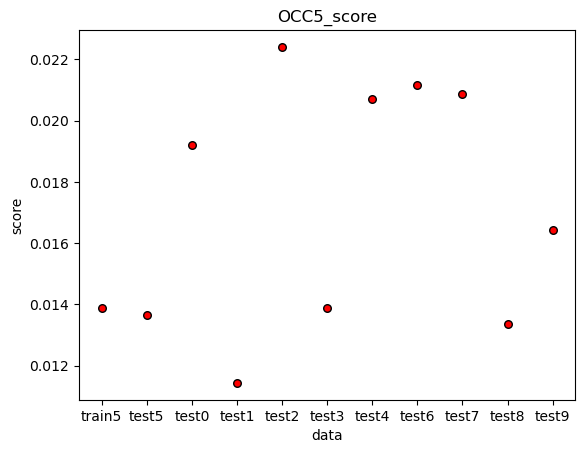

time: 172 ms (started: 2022-12-14 05:16:39 +09:00)


In [122]:
plt.xlabel("data")
plt.ylabel("score")
plt.title("OCC5_score") 
plt.scatter(x=["train5",'test5','test0','test1','test2','test3','test4','test6','test7','test8','test9'],y=score_stack,
            marker='o',
            s=30,
            c='red',
            edgecolors='black')
plt.savefig('./img/OCC5/qsvdd/OCC5_score.png')
plt.show()

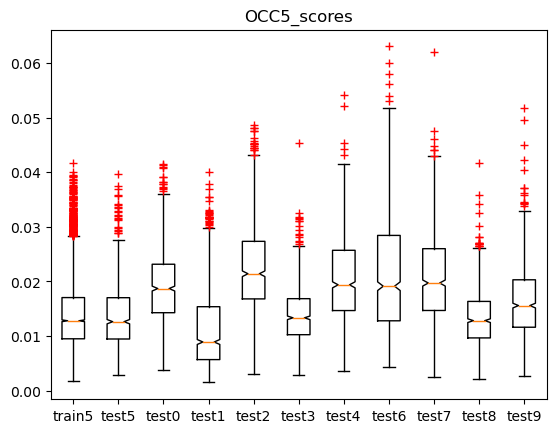

time: 250 ms (started: 2022-12-14 05:16:39 +09:00)


In [123]:
fig,ax = plt.subplots()
ax.boxplot([score_var_train,score_var_test0,score_var_test1,score_var_test2,score_var_test3,score_var_test4,score_var_test5,
score_var_test6,score_var_test7,score_var_test8,score_var_test9],notch=True,sym='r+')
plt.title('OCC5_scores')
plt.xticks([1,2,3,4,5,6,7,8,9,10,11],["train5",'test5','test0','test1','test2','test3','test4','test6','test7','test8','test9'])
plt.savefig('./img/OCC5/qsvdd/OCC5_scores.png')
plt.show()




### AUROC

In [124]:
from sklearn.metrics import roc_auc_score, roc_curve, auc

time: 0 ns (started: 2022-12-14 05:16:39 +09:00)


In [125]:
def radius(data, center):
    res = []
    for j in range(len(data)):
        res.append(sum(abs(data - center)[j]**2))
    return res
        

time: 0 ns (started: 2022-12-14 05:16:39 +09:00)


In [126]:
radius_train0 = radius(data = predictions_exp0, center = center)
radius_test0 = radius(data = predictions_exp0_test, center = center)
radius_test1 = radius(data = predictions_exp1, center = center)
radius_test2 = radius(data = predictions_exp2, center = center)
radius_test3 = radius(data = predictions_exp3, center = center)
radius_test4 = radius(data = predictions_exp4, center = center)
radius_test5 = radius(data = predictions_exp5, center = center)
radius_test6 = radius(data = predictions_exp6, center = center)
radius_test7 = radius(data = predictions_exp7, center = center)
radius_test8 = radius(data = predictions_exp8, center = center)
radius_test9 = radius(data = predictions_exp9, center = center)

time: 3.09 s (started: 2022-12-14 05:16:39 +09:00)


In [127]:
y_pred0 = np.array(radius_test0)
y_true0 = np.zeros(len(radius_test0), dtype=int)
y_pred1 = np.array(radius_test1)
y_true1 = np.ones(len(radius_test1), dtype=int)
y_pred2 = np.array(radius_test2)
y_true2 = np.ones(len(radius_test2), dtype=int)
y_pred3 = np.array(radius_test3)
y_true3 = np.ones(len(radius_test3), dtype=int)
y_pred4 = np.array(radius_test4)
y_true4 = np.ones(len(radius_test4), dtype=int)
y_pred5 = np.array(radius_test5)
y_true5 = np.ones(len(radius_test5), dtype=int)
y_pred6 = np.array(radius_test6)
y_true6 = np.ones(len(radius_test6), dtype=int)
y_pred7 = np.array(radius_test7)
y_true7 = np.ones(len(radius_test7), dtype=int)
y_pred8 = np.array(radius_test8)
y_true8 = np.ones(len(radius_test8), dtype=int)
y_pred9 = np.array(radius_test9)
y_true9 = np.ones(len(radius_test9), dtype=int)

time: 0 ns (started: 2022-12-14 05:16:42 +09:00)


In [128]:
y_pred01 = np.concatenate((y_pred0,y_pred1),axis=None)
y_true01 = np.concatenate((y_true0,y_true1),axis=None)
y_pred02 = np.concatenate((y_pred0,y_pred2),axis=None)
y_true02 = np.concatenate((y_true0,y_true2),axis=None)
y_pred03 = np.concatenate((y_pred0,y_pred3),axis=None)
y_true03 = np.concatenate((y_true0,y_true3),axis=None)
y_pred04 = np.concatenate((y_pred0,y_pred4),axis=None)
y_true04 = np.concatenate((y_true0,y_true4),axis=None)
y_pred05 = np.concatenate((y_pred0,y_pred5),axis=None)
y_true05 = np.concatenate((y_true0,y_true5),axis=None)
y_pred06 = np.concatenate((y_pred0,y_pred6),axis=None)
y_true06 = np.concatenate((y_true0,y_true6),axis=None)
y_pred07 = np.concatenate((y_pred0,y_pred7),axis=None)
y_true07 = np.concatenate((y_true0,y_true7),axis=None)
y_pred08 = np.concatenate((y_pred0,y_pred8),axis=None)
y_true08 = np.concatenate((y_true0,y_true8),axis=None)
y_pred09 = np.concatenate((y_pred0,y_pred9),axis=None)
y_true09 = np.concatenate((y_true0,y_true9),axis=None)

time: 0 ns (started: 2022-12-14 05:16:42 +09:00)


In [129]:
# fpr, tpr, _ = roc_curve(y_true01, y_pred01)
# auc_measure = auc(fpr,tpr)
# auc_measure

time: 0 ns (started: 2022-12-14 05:16:42 +09:00)


In [130]:
fpr1, tpr1, _ = roc_curve(y_true01, y_pred01)
fpr2, tpr2, _ = roc_curve(y_true02, y_pred02)
fpr3, tpr3, _ = roc_curve(y_true03, y_pred03)
fpr4, tpr4, _ = roc_curve(y_true04, y_pred04)
fpr5, tpr5, _ = roc_curve(y_true05, y_pred05)
fpr6, tpr6, _ = roc_curve(y_true06, y_pred06)
fpr7, tpr7, _ = roc_curve(y_true07, y_pred07)
fpr8, tpr8, _ = roc_curve(y_true08, y_pred08)
fpr9, tpr9, _ = roc_curve(y_true09, y_pred09)

time: 16 ms (started: 2022-12-14 05:16:42 +09:00)


In [131]:
auc1 = roc_auc_score(y_true01,y_pred01)
auc2 = roc_auc_score(y_true02,y_pred02)
auc3 = roc_auc_score(y_true03,y_pred03)
auc4 = roc_auc_score(y_true04,y_pred04)
auc5 = roc_auc_score(y_true05,y_pred05)
auc6 = roc_auc_score(y_true06,y_pred06)
auc7 = roc_auc_score(y_true07,y_pred07)
auc8 = roc_auc_score(y_true08,y_pred08)
auc9 = roc_auc_score(y_true09,y_pred09)
auc = [auc1,auc2,auc3,auc4,auc5,auc6,auc7,auc8,auc9]

time: 15 ms (started: 2022-12-14 05:16:42 +09:00)


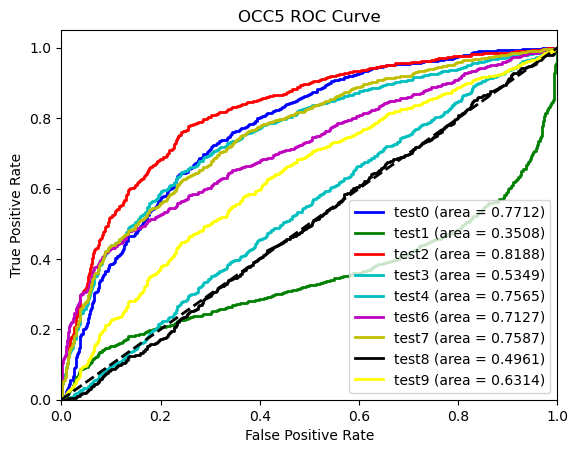

time: 266 ms (started: 2022-12-14 05:16:42 +09:00)


In [132]:
plt.figure()
lw = 2
plt.plot(fpr1,tpr1,color='b',lw=lw,label="test0 (area = %0.4f)" % auc1)
plt.plot(fpr2,tpr2,color="g",lw=lw,label="test1 (area = %0.4f)" % auc2)
plt.plot(fpr3,tpr3,color="r",lw=lw,label="test2 (area = %0.4f)" % auc3)
plt.plot(fpr4,tpr4,color="c",lw=lw,label="test3 (area = %0.4f)" % auc4)
plt.plot(fpr5,tpr5,color="c",lw=lw,label="test4 (area = %0.4f)" % auc5)
plt.plot(fpr6,tpr6,color="m",lw=lw,label="test6 (area = %0.4f)" % auc6)
plt.plot(fpr7,tpr7,color="y",lw=lw,label="test7 (area = %0.4f)" % auc7)
plt.plot(fpr8,tpr8,color="k",lw=lw,label="test8 (area = %0.4f)" % auc8)
plt.plot(fpr9,tpr9,color="yellow",lw=lw,label="test9 (area = %0.4f)" % auc9)


plt.plot([0, 1], [0, 1], color="black", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("OCC5 ROC Curve")
plt.legend(loc="lower right")
plt.savefig('./img/OCC5/qsvdd/OCC5_ROC.png')
plt.show()

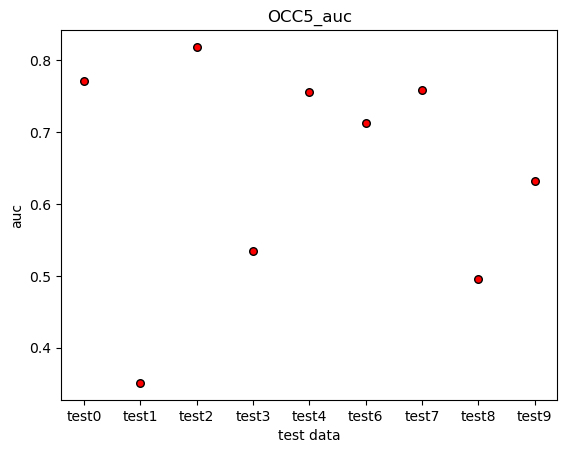

time: 157 ms (started: 2022-12-14 05:16:43 +09:00)


In [133]:
plt.xlabel("test data")
plt.ylabel("auc")
plt.title("OCC5_auc") 
plt.scatter(x=['test0','test1','test2','test3','test4','test6','test7','test8','test9'],y=auc,
            marker='o',
            s=30,
            c='red',
            edgecolors='black')
plt.savefig('./img/OCC5/qsvdd/OCC5_auc.png')
plt.show()

In [134]:
print(auc)

[0.7712361712361713, 0.35076857661292316, 0.8188289005472469, 0.5349079352379683, 0.7565128542725285, 0.712667149340775, 0.758684990851009, 0.4961455762277117, 0.6313615173872855]
time: 0 ns (started: 2022-12-14 05:16:43 +09:00)


In [135]:
savetxt('./img/OCC5/qsvdd/auc_OCC5.txt',auc,delimiter=',', fmt='%0.6f')

time: 0 ns (started: 2022-12-14 05:16:43 +09:00)


In [136]:
y_pred_ano = np.concatenate((y_pred1,y_pred2,y_pred3,y_pred4,y_pred5,y_pred6,y_pred7,y_pred8,y_pred9), axis=None)
y_true_ano = np.concatenate((y_true1,y_true2,y_true3,y_true4,y_true5,y_true6,y_true7,y_true8,y_true9), axis=None)
y_pred_all = np.concatenate((y_pred0,y_pred_ano),axis=None)
y_true_all = np.concatenate((y_true0,y_true_ano),axis=None)

time: 0 ns (started: 2022-12-14 05:16:43 +09:00)


In [137]:
fpr_all, tpr_all, _ = roc_curve(y_true_all, y_pred_all)
auc_all = roc_auc_score(y_true_all, y_pred_all)


time: 16 ms (started: 2022-12-14 05:16:43 +09:00)


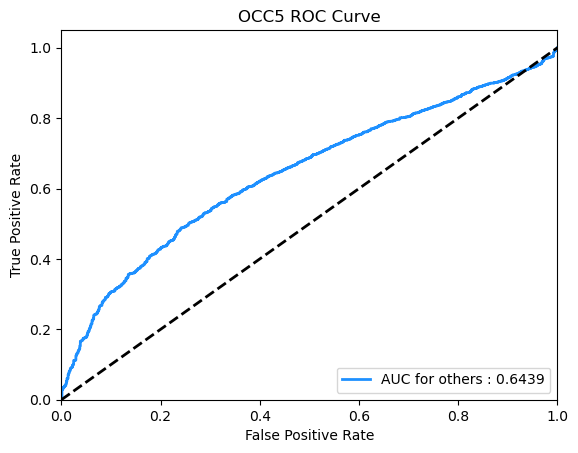

time: 172 ms (started: 2022-12-14 05:16:43 +09:00)


In [138]:
plt.figure()
lw = 2
plt.plot(fpr_all,tpr_all,color='dodgerblue',lw=lw,label="AUC for others : %0.4f" % auc_all)
plt.plot([0, 1], [0, 1], color="black", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("OCC5 ROC Curve")
plt.legend(loc="lower right")
plt.savefig('./img/OCC5/qsvdd/OCC5_ROC_all.png')
plt.show()

In [139]:
auc.append(auc_all)

time: 0 ns (started: 2022-12-14 05:16:43 +09:00)


In [140]:
auc

[0.7712361712361713,
 0.35076857661292316,
 0.8188289005472469,
 0.5349079352379683,
 0.7565128542725285,
 0.712667149340775,
 0.758684990851009,
 0.4961455762277117,
 0.6313615173872855,
 0.6439471571223877]

time: 0 ns (started: 2022-12-14 05:16:43 +09:00)


In [141]:
savetxt('./img/OCC5/qsvdd/auc_OCC5.txt',auc,delimiter=',', fmt='%0.6f')

time: 0 ns (started: 2022-12-14 05:16:43 +09:00)
